In [115]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline  


In [167]:
df = pd.read_csv(r'C:\Users\treshanw\OneDrive - Star Garments\Datathon\dataset_feature_small.csv')


In [117]:
df.columns

Index(['LAST_DTE_YEAR', 'ORIG_DTE_YEAR', 'ORIG - FRST DAYS', 'ORIG-LAST DAYS',
       'EXP_LAST_DATE', 'LAST_STAT', 'ORIG_CHN', 'SELLER', 'SELLER_SEG',
       'orig_rt', 'RATE_SEGMENT', 'LAST_RT', 'orig_amt', 'AMT SEGMENT',
       'ORIG_VAL', 'DIFF_VAL_AMT', 'LAST_UPB', 'orig_trm', 'oltv',
       'oltv_segment', 'ocltv', 'num_bo', 'dti', 'CSCORE_B', 'CSCORE_SEG',
       'FTHB_FLG', 'purpose', 'PROP_TYP', 'NUM_UNIT', 'occ_stat', 'msa',
       'zip_3', 'NET_LOSS', 'relo_flg', 'INRST_INCOME', 'INRST_INCOME_SEG'],
      dtype='object')

In [118]:
Q1 = df['orig_amt'].quantile(0.25)
Q3 = df['orig_amt'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

a = Q3+(IQR*1.5)
a

98000.0


337000.0

In [119]:
df = df[df['orig_amt']<a]

In [120]:
Q1 = df['orig_rt'].quantile(0.25)
Q3 = df['orig_rt'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

a = Q3+(IQR*1.5)
a

2.0


8.875

In [121]:
len(df[df['orig_rt']>a])

261

In [122]:
df = df[df['orig_rt']<a]

In [123]:
df

,LAST_DTE_YEAR,ORIG_DTE_YEAR,ORIG - FRST DAYS,ORIG-LAST DAYS,EXP_LAST_DATE,LAST_STAT,ORIG_CHN,SELLER,SELLER_SEG,orig_rt,...,purpose,PROP_TYP,NUM_UNIT,occ_stat,msa,zip_3,NET_LOSS,relo_flg,INRST_INCOME,INRST_INCOME_SEG
0,2002,2000,60,912,11/14/2014,P,C,Other,C,7.750,...,C,SF,1,P,36540,680.0,NaN,N,69750,E
1,2002,2000,60,974,7/27/2029,P,B,Other,C,8.000,...,P,SF,1,P,30700,685.0,NaN,N,225600,C
2,2001,2000,61,640,12/13/2014,P,R,Other,C,8.250,...,C,SF,1,P,36540,681.0,NaN,N,87863,E
3,2001,1999,62,487,6/26/2029,P,C,"Jpmorgan Chase Bank, Na",D,7.875,...,P,SF,1,P,30700,685.0,NaN,N,179550,D
4,2002,2000,60,943,7/27/2029,P,C,"Jpmorgan Chase Bank, Na",D,7.750,...,P,SF,1,P,0,689.0,NaN,N,116250,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
269960,2021,2020,61,273,12/26/2049,C,C,Federal Home Loan Bank of Chicago,A,3.125,...,P,PU,1,P,36540,680.0,NaN,N,234375,C
269962,2021,2020,61,304,11/25/2049,C,R,Other,C,3.250,...,R,PU,1,P,36540,680.0,NaN,N,162825,D
269964,2021,2020,61,304,11/25/2049,C,R,Fairway Independent Mortgage Corporation,A,3.250,...,P,PU,1,P,30700,685.0,NaN,N,148200,D
269965,2021,2020,61,304,11/25/2049,C,R,Other,C,3.375,...,P,SF,1,P,36540,680.0,NaN,N,271350,C


In [124]:
df2 = df[df['LAST_STAT']!= "P"]
df2 = df2[df2['LAST_STAT']!= "C"]

In [125]:
df2

,LAST_DTE_YEAR,ORIG_DTE_YEAR,ORIG - FRST DAYS,ORIG-LAST DAYS,EXP_LAST_DATE,LAST_STAT,ORIG_CHN,SELLER,SELLER_SEG,orig_rt,...,purpose,PROP_TYP,NUM_UNIT,occ_stat,msa,zip_3,NET_LOSS,relo_flg,INRST_INCOME,INRST_INCOME_SEG
53,2002,1999,62,852,6/26/2029,F,R,Bishops Gate Residential Mortgage Trust,D,8.125,...,R,SF,1,P,36540,681.0,10957.89,N,80438,E
98,2004,2000,60,1582,11/14/2014,T,B,"Jpmorgan Chase Bank, National Association",C,8.250,...,C,SF,1,P,36540,681.0,246.78,N,69300,E
174,2004,2000,60,1766,7/27/2029,F,R,Other,C,8.500,...,R,SF,1,P,36540,681.0,18452.18,N,114750,D
253,2005,1999,62,2039,9/13/2014,R,C,"Jpmorgan Chase Bank, Na",D,7.500,...,P,SF,1,P,36540,681.0,NaN,N,45000,E
265,2008,1999,30,3075,3/27/2029,T,R,Other,C,6.150,...,P,SF,1,P,24260,688.0,34.50,N,81180,E
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
269039,2021,2020,61,304,2/12/2035,D,R,Other,C,2.750,...,R,SF,1,P,0,689.0,NaN,N,53625,E
269413,2021,2020,61,304,11/25/2049,D,C,"AmeriHome Mortgage Company, LLC",B,3.625,...,P,PU,1,P,30700,685.0,NaN,N,216413,C
269509,2021,2020,61,304,2/12/2035,D,C,Other,C,2.750,...,R,SF,1,P,30700,683.0,NaN,N,121688,D
269561,2021,2020,91,334,10/26/2049,D,C,Other,C,3.125,...,R,PU,1,P,36540,681.0,NaN,N,251250,C


In [126]:
df2.columns

Index(['LAST_DTE_YEAR', 'ORIG_DTE_YEAR', 'ORIG - FRST DAYS', 'ORIG-LAST DAYS',
       'EXP_LAST_DATE', 'LAST_STAT', 'ORIG_CHN', 'SELLER', 'SELLER_SEG',
       'orig_rt', 'RATE_SEGMENT', 'LAST_RT', 'orig_amt', 'AMT SEGMENT',
       'ORIG_VAL', 'DIFF_VAL_AMT', 'LAST_UPB', 'orig_trm', 'oltv',
       'oltv_segment', 'ocltv', 'num_bo', 'dti', 'CSCORE_B', 'CSCORE_SEG',
       'FTHB_FLG', 'purpose', 'PROP_TYP', 'NUM_UNIT', 'occ_stat', 'msa',
       'zip_3', 'NET_LOSS', 'relo_flg', 'INRST_INCOME', 'INRST_INCOME_SEG'],
      dtype='object')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

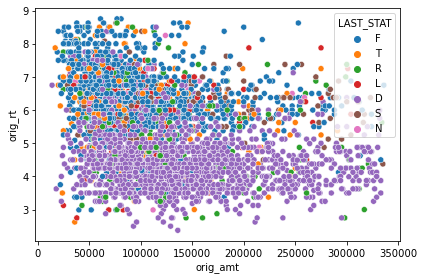

In [127]:
sns.scatterplot(data = df2, x = 'orig_amt', y='orig_rt', hue = 'LAST_STAT')



In [128]:
dd = df2[df2['LAST_STAT']== "D"]

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

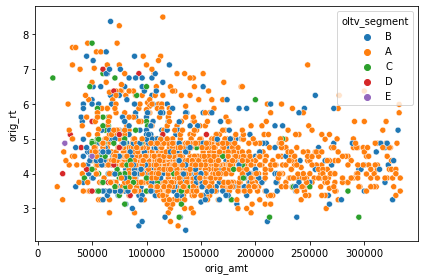

In [129]:
sns.scatterplot(data = dd, x = 'orig_amt', y='orig_rt', hue = 'oltv_segment')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

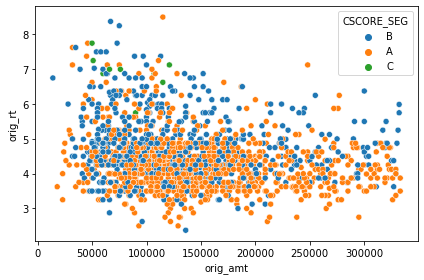

In [130]:
sns.scatterplot(data = dd, x = 'orig_amt', y='orig_rt', hue = 'CSCORE_SEG')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

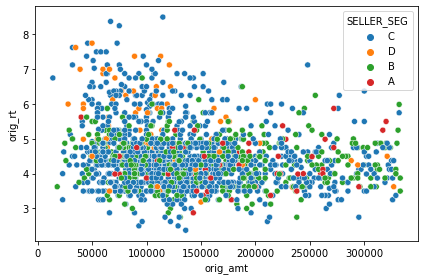

In [131]:
sns.scatterplot(data = dd, x = 'orig_amt', y='orig_rt', hue = 'SELLER_SEG')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

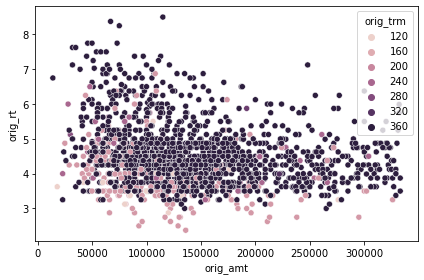

In [132]:
sns.scatterplot(data = dd, x = 'orig_amt', y='orig_rt', hue ='orig_trm' )

In [133]:
dff = df2[df2['LAST_STAT']== "F"]

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

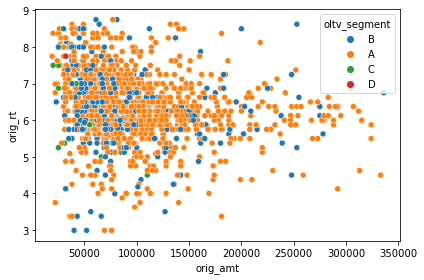

In [134]:
sns.scatterplot(data = dff, x = 'orig_amt', y='orig_rt', hue = 'oltv_segment')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

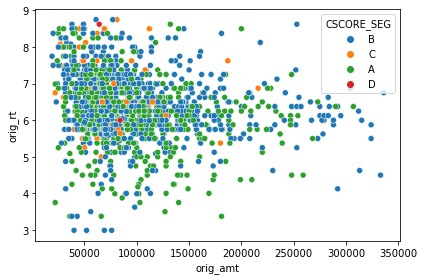

In [135]:
sns.scatterplot(data = dff, x = 'orig_amt', y='orig_rt', hue = 'CSCORE_SEG')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

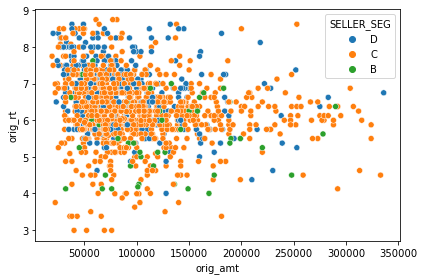

In [136]:
sns.scatterplot(data = dff, x = 'orig_amt', y='orig_rt', hue = 'SELLER_SEG')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

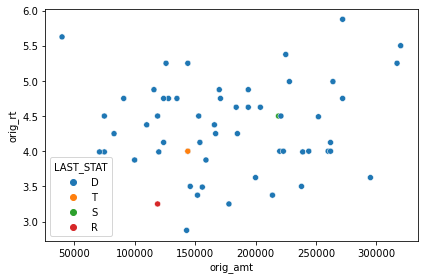

In [137]:
topsellers = df2[df2['SELLER_SEG']== "A"]
sns.scatterplot(data = topsellers, x = 'orig_amt', y='orig_rt', hue = 'LAST_STAT')

In [138]:
dfp = df[df['LAST_STAT']== "P"]

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

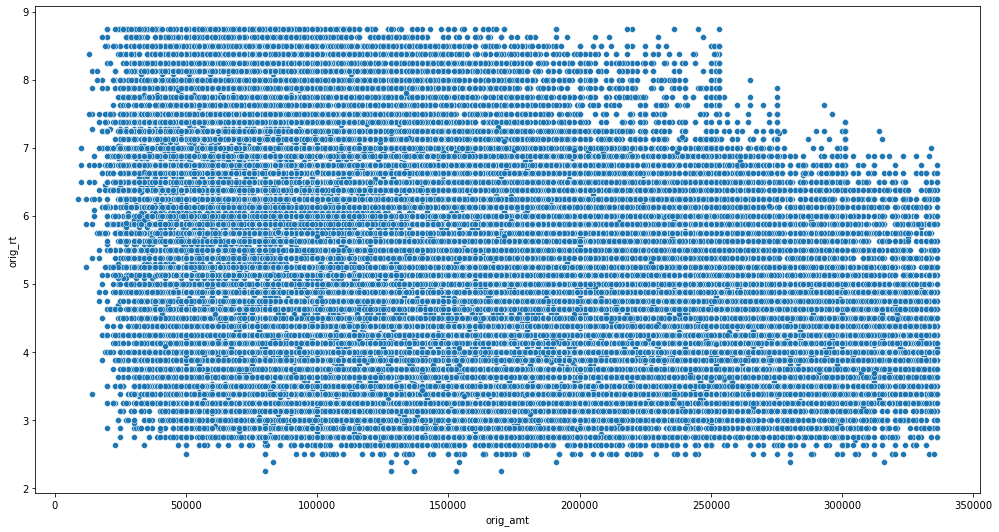

In [139]:
plt.rcParams["figure.figsize"] = [14.00, 7.50]
plt.rcParams["figure.autolayout"] = True
sns.scatterplot(data = dfp, x = 'orig_amt', y='orig_rt')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

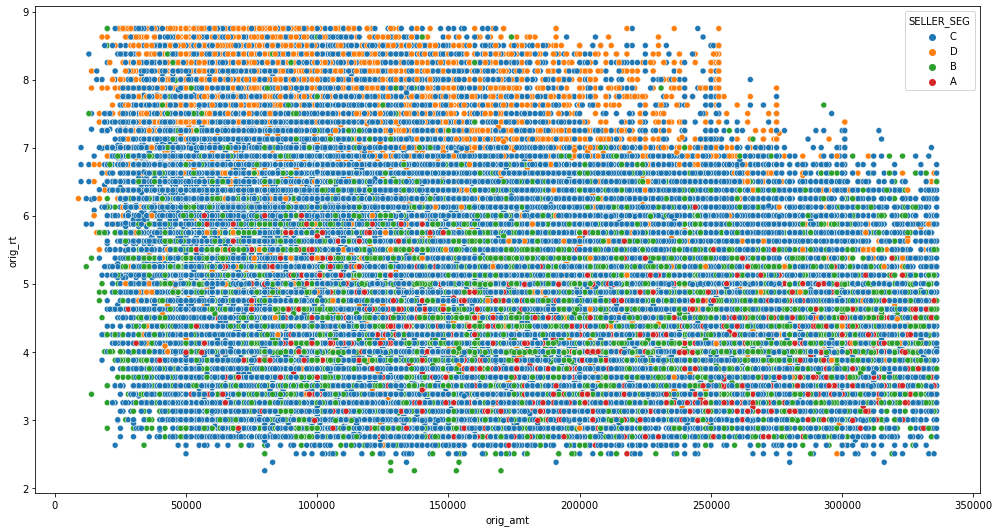

In [140]:
sns.scatterplot(data = dfp, x = 'orig_amt', y='orig_rt', hue = 'SELLER_SEG')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

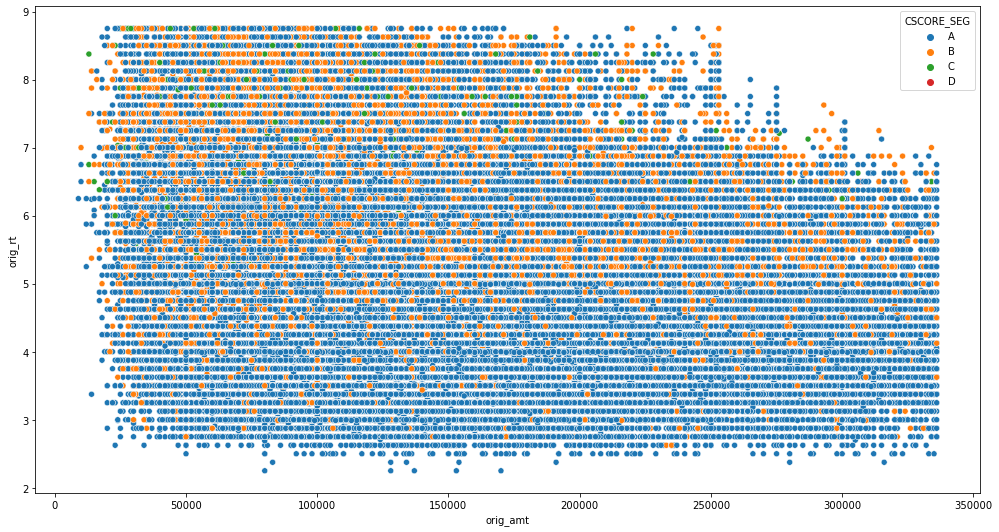

In [141]:
sns.scatterplot(data = dfp, x = 'orig_amt', y='orig_rt', hue = 'CSCORE_SEG')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

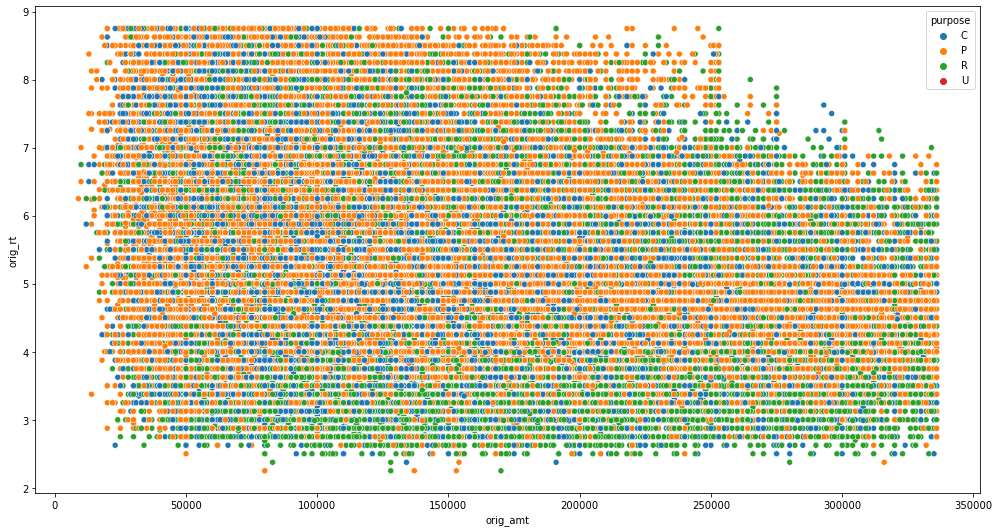

In [142]:
sns.scatterplot(data = dfp, x = 'orig_amt', y='orig_rt', hue = 'purpose')

In [143]:
dfp.columns

Index(['LAST_DTE_YEAR', 'ORIG_DTE_YEAR', 'ORIG - FRST DAYS', 'ORIG-LAST DAYS',
       'EXP_LAST_DATE', 'LAST_STAT', 'ORIG_CHN', 'SELLER', 'SELLER_SEG',
       'orig_rt', 'RATE_SEGMENT', 'LAST_RT', 'orig_amt', 'AMT SEGMENT',
       'ORIG_VAL', 'DIFF_VAL_AMT', 'LAST_UPB', 'orig_trm', 'oltv',
       'oltv_segment', 'ocltv', 'num_bo', 'dti', 'CSCORE_B', 'CSCORE_SEG',
       'FTHB_FLG', 'purpose', 'PROP_TYP', 'NUM_UNIT', 'occ_stat', 'msa',
       'zip_3', 'NET_LOSS', 'relo_flg', 'INRST_INCOME', 'INRST_INCOME_SEG'],
      dtype='object')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

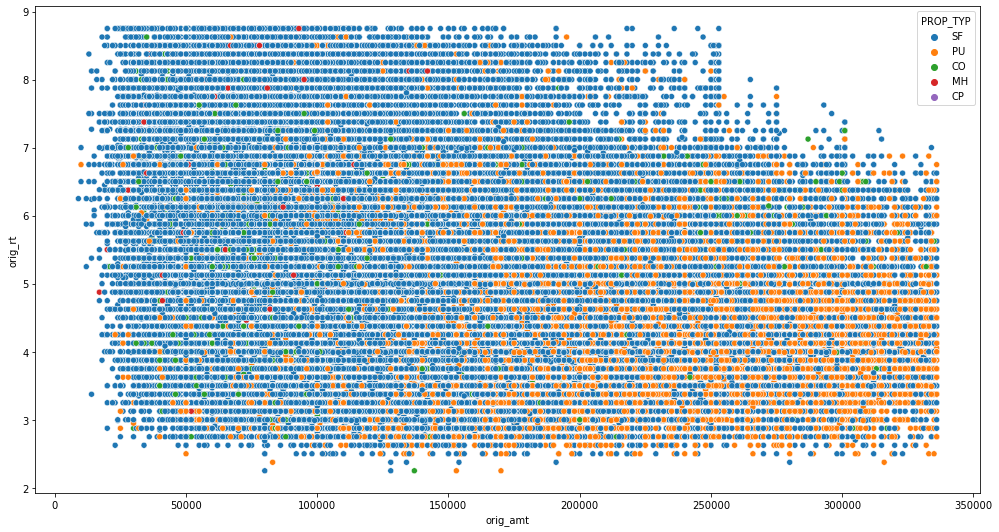

In [144]:
sns.scatterplot(data = dfp, x = 'orig_amt', y='orig_rt', hue = 'PROP_TYP')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

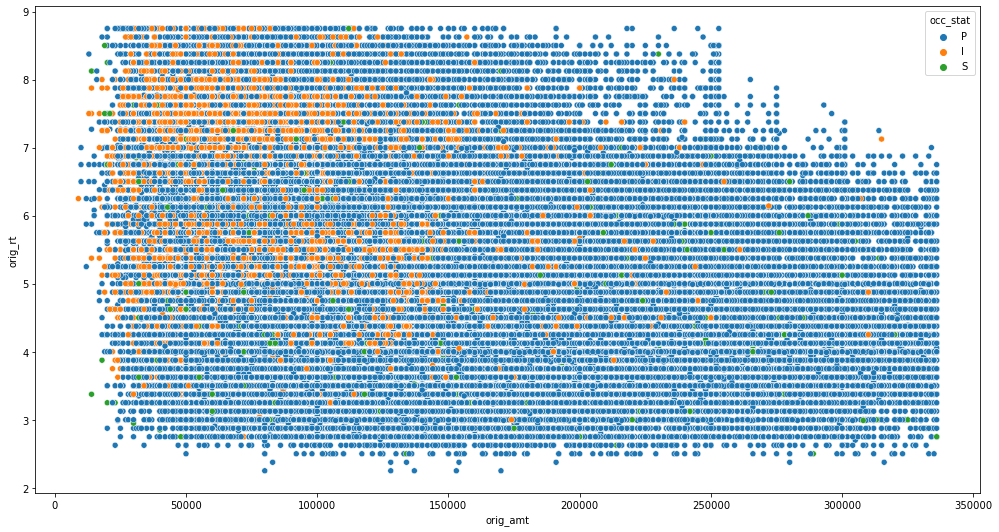

In [145]:
sns.scatterplot(data = dfp, x = 'orig_amt', y='orig_rt', hue = 'occ_stat')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

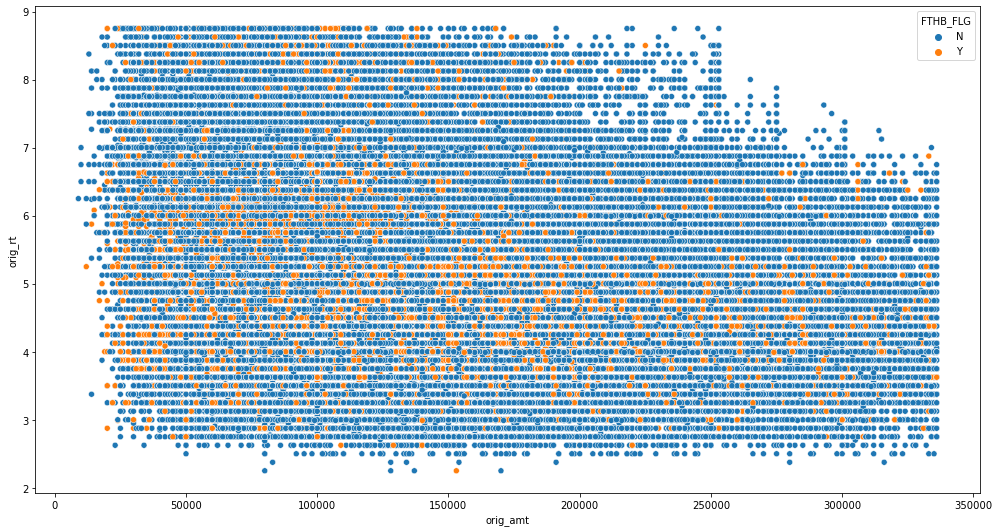

In [146]:
sns.scatterplot(data = dfp, x = 'orig_amt', y='orig_rt', hue = 'FTHB_FLG')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

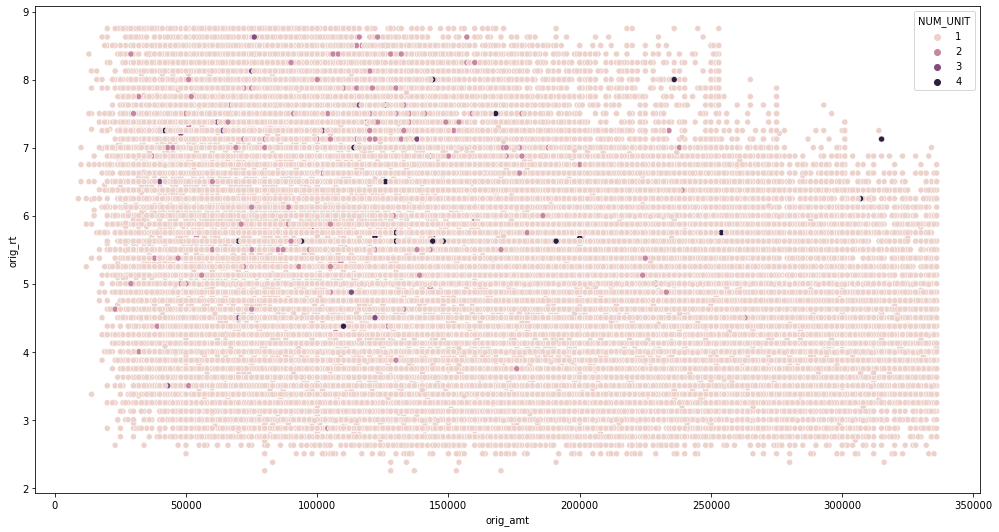

In [147]:
sns.scatterplot(data = dfp, x = 'orig_amt', y='orig_rt', hue = 'NUM_UNIT')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

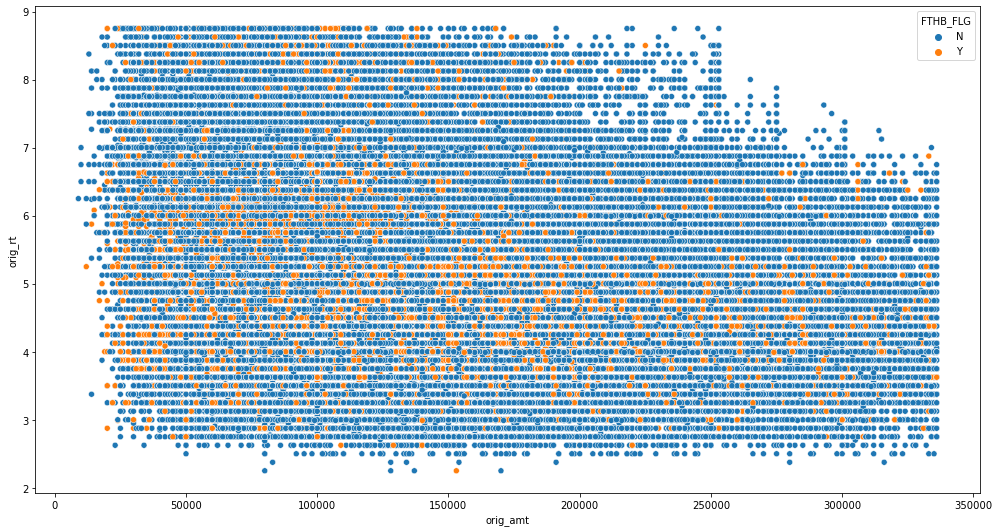

In [148]:
sns.scatterplot(data = dfp, x = 'orig_amt', y='orig_rt', hue = 'FTHB_FLG')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

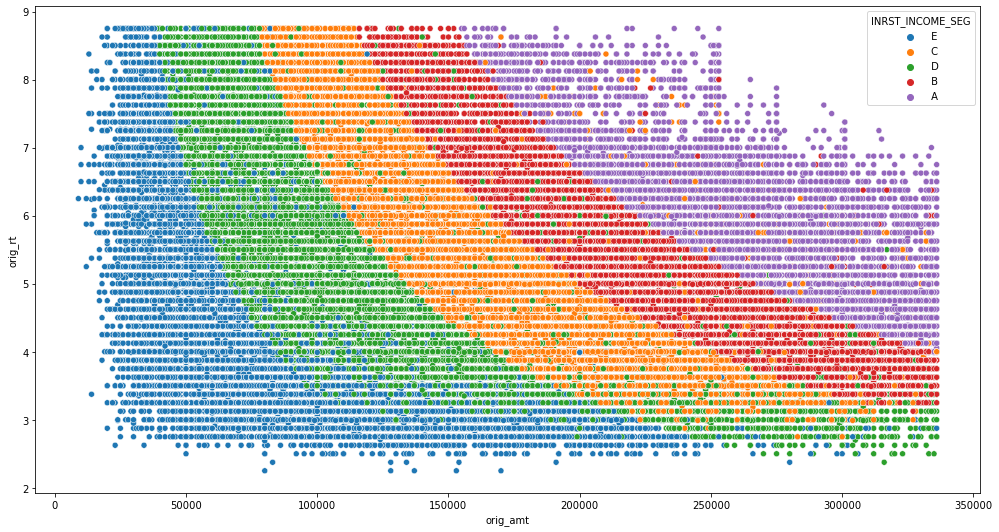

In [162]:
sns.scatterplot(data = dfp, x = 'orig_amt', y='orig_rt', hue = 'INRST_INCOME_SEG')

In [149]:
df.columns

Index(['LAST_DTE_YEAR', 'ORIG_DTE_YEAR', 'ORIG - FRST DAYS', 'ORIG-LAST DAYS',
       'EXP_LAST_DATE', 'LAST_STAT', 'ORIG_CHN', 'SELLER', 'SELLER_SEG',
       'orig_rt', 'RATE_SEGMENT', 'LAST_RT', 'orig_amt', 'AMT SEGMENT',
       'ORIG_VAL', 'DIFF_VAL_AMT', 'LAST_UPB', 'orig_trm', 'oltv',
       'oltv_segment', 'ocltv', 'num_bo', 'dti', 'CSCORE_B', 'CSCORE_SEG',
       'FTHB_FLG', 'purpose', 'PROP_TYP', 'NUM_UNIT', 'occ_stat', 'msa',
       'zip_3', 'NET_LOSS', 'relo_flg', 'INRST_INCOME', 'INRST_INCOME_SEG'],
      dtype='object')

<AxesSubplot:xlabel='orig_amt', ylabel='msa'>

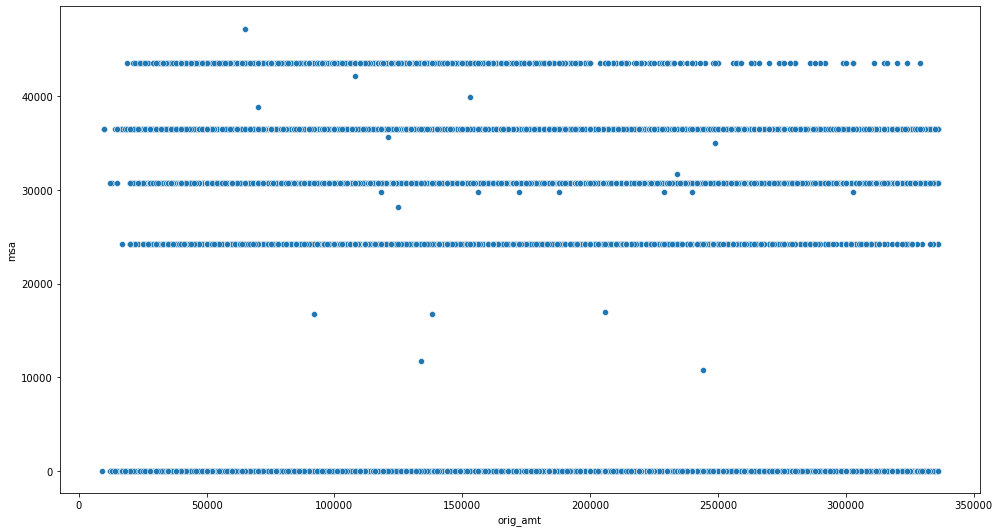

In [150]:
sns.scatterplot(data = dfp, x = 'orig_amt', y='msa')

<AxesSubplot:xlabel='orig_amt', ylabel='orig_rt'>

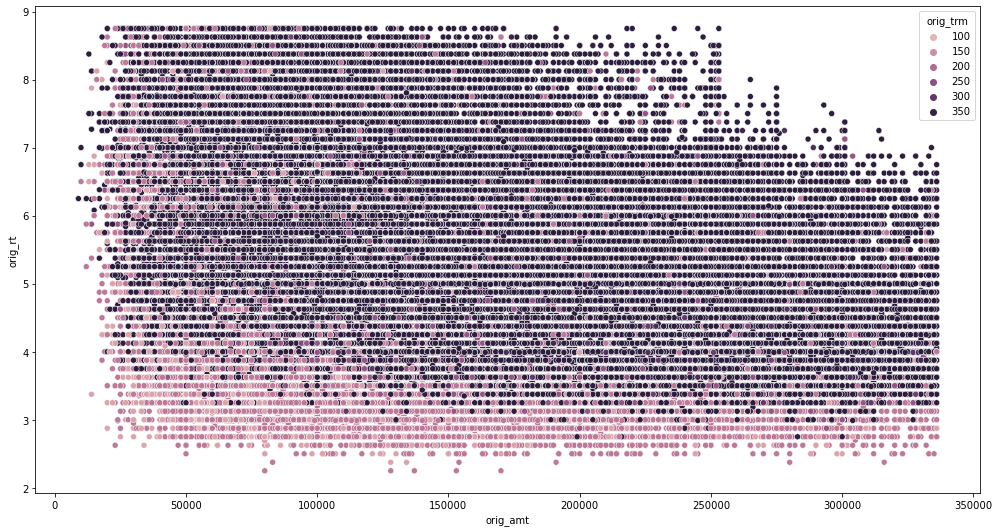

In [151]:
sns.scatterplot(data = dfp, x = 'orig_amt', y='orig_rt', hue = 'orig_trm')

In [152]:
dfp.columns

Index(['LAST_DTE_YEAR', 'ORIG_DTE_YEAR', 'ORIG - FRST DAYS', 'ORIG-LAST DAYS',
       'EXP_LAST_DATE', 'LAST_STAT', 'ORIG_CHN', 'SELLER', 'SELLER_SEG',
       'orig_rt', 'RATE_SEGMENT', 'LAST_RT', 'orig_amt', 'AMT SEGMENT',
       'ORIG_VAL', 'DIFF_VAL_AMT', 'LAST_UPB', 'orig_trm', 'oltv',
       'oltv_segment', 'ocltv', 'num_bo', 'dti', 'CSCORE_B', 'CSCORE_SEG',
       'FTHB_FLG', 'purpose', 'PROP_TYP', 'NUM_UNIT', 'occ_stat', 'msa',
       'zip_3', 'NET_LOSS', 'relo_flg', 'INRST_INCOME', 'INRST_INCOME_SEG'],
      dtype='object')

<AxesSubplot:xlabel='INRST_INCOME', ylabel='orig_amt'>

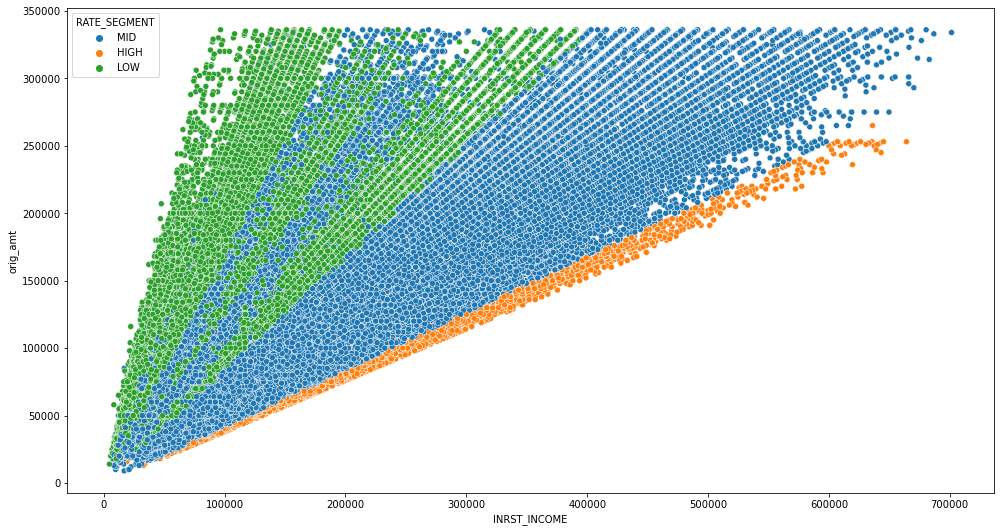

In [156]:
sns.scatterplot(data = dfp, x = 'INRST_INCOME', y= 'orig_amt', hue = 'RATE_SEGMENT')



<AxesSubplot:xlabel='INRST_INCOME', ylabel='orig_amt'>

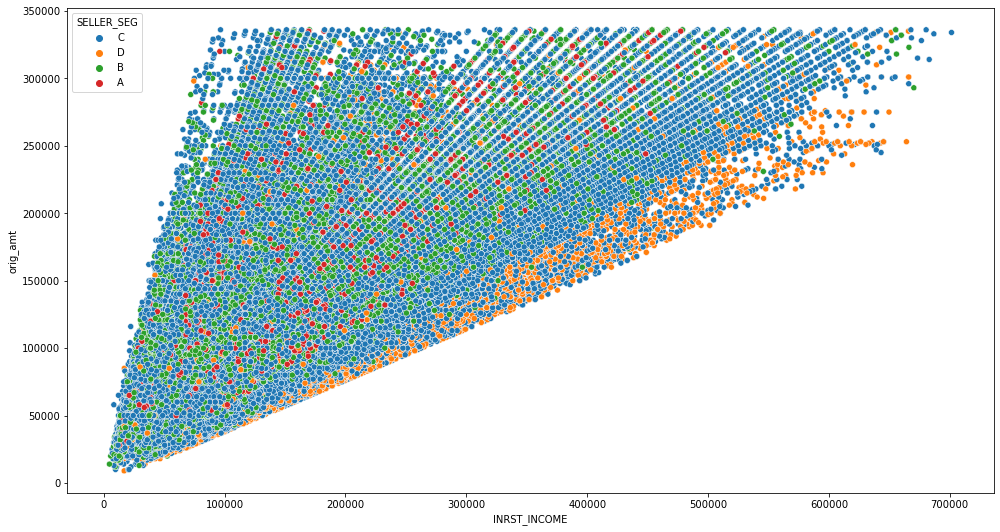

In [157]:
sns.scatterplot(data = dfp, x = 'INRST_INCOME', y= 'orig_amt', hue = 'SELLER_SEG')

<AxesSubplot:xlabel='INRST_INCOME', ylabel='orig_amt'>

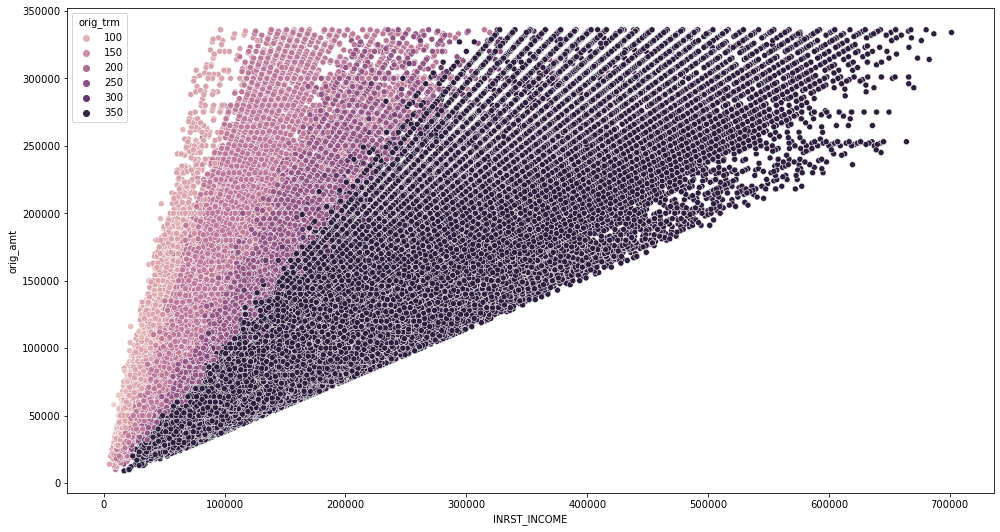

In [158]:
sns.scatterplot(data = dfp, x = 'INRST_INCOME', y= 'orig_amt', hue = 'orig_trm')

In [159]:
df.columns

Index(['LAST_DTE_YEAR', 'ORIG_DTE_YEAR', 'ORIG - FRST DAYS', 'ORIG-LAST DAYS',
       'EXP_LAST_DATE', 'LAST_STAT', 'ORIG_CHN', 'SELLER', 'SELLER_SEG',
       'orig_rt', 'RATE_SEGMENT', 'LAST_RT', 'orig_amt', 'AMT SEGMENT',
       'ORIG_VAL', 'DIFF_VAL_AMT', 'LAST_UPB', 'orig_trm', 'oltv',
       'oltv_segment', 'ocltv', 'num_bo', 'dti', 'CSCORE_B', 'CSCORE_SEG',
       'FTHB_FLG', 'purpose', 'PROP_TYP', 'NUM_UNIT', 'occ_stat', 'msa',
       'zip_3', 'NET_LOSS', 'relo_flg', 'INRST_INCOME', 'INRST_INCOME_SEG'],
      dtype='object')

In [166]:
dfp.groupby(['SELLER_SEG','RATE_SEGMENT'])['INRST_INCOME'].sum()/dfp.groupby(['SELLER_SEG','RATE_SEGMENT'])['INRST_INCOME'].count()

SELLER_SEG  RATE_SEGMENT
A           LOW             179451.897137
            MID             247386.415397
B           HIGH            192473.906977
            LOW             141814.359299
            MID             212284.850750
C           HIGH            236631.096974
            LOW             123544.549037
            MID             192025.320084
D           HIGH            243111.297105
            LOW             130364.939560
            MID             184068.143533
Name: INRST_INCOME, dtype: float64

In [ ]:
dfp.groupby(['SELLER_SE','RATE_SEGMENT'])['INRST_INCOME'].sum()/dfp.groupby(['SELLER_SEG','RATE_SEGMENT'])['INRST_INCOME'].count()